In [2]:
import numpy as np
from keras.preprocessing import image
from tensorflow.keras.utils import img_to_array
from tensorflow.keras.applications.resnet50 import ResNet50 as resnet50,preprocess_input
from tensorflow.keras.applications.vgg16 import VGG16 as vgg,preprocess_input
from keras.applications.imagenet_utils import decode_predictions
import matplotlib.pyplot as plt
import tensorflow as tf
import cv2
from keras.models import Model
from keras.layers import Dense, Dropout, Flatten, MaxPooling2D,Conv2D
from keras.optimizers import Adam
import keras.utils as image
from keras.preprocessing.image import ImageDataGenerator
import os
from PIL import Image
import PIL
import shutil
from sklearn.metrics import accuracy_score
import matplotlib.image as IMG
from keras.callbacks import EarlyStopping
from plotly.subplots import make_subplots
import plotly.graph_objects as go
import glob
import random

ModuleNotFoundError: No module named 'keras'

In [2]:
def train_folder():
    global traingen,validgen,testgen
    # using image augmentation 
    train_generator = ImageDataGenerator(rotation_range=2, 
                                      brightness_range=[0.1, 0.3],
                                      width_shift_range=0.1, 
                                      height_shift_range=0.1,
                                      horizontal_flip=True, 
                                      vertical_flip=True,
                                      preprocessing_function=preprocess_input)

    test_generator = ImageDataGenerator(preprocessing_function=preprocess_input)


    train_generator = ImageDataGenerator(rotation_range=2, 
                                  brightness_range=[0.1, 0.3],
                                  width_shift_range=0.1, 
                                  height_shift_range=0.1,
                                  horizontal_flip=True, 
                                  vertical_flip=True,
                                  preprocessing_function=preprocess_input)

    test_generator = ImageDataGenerator(preprocessing_function=preprocess_input)

# getting folder image count
    train_data_dir = "/Users/draculalemon/Downloads/archive-2/training"
    validation_data="/Users/draculalemon/Downloads/archive-2/validation"
    test_data_dir="/Users/draculalemon/Downloads/archive-2/test/"



    traingen = train_generator.flow_from_directory(train_data_dir,
                                                   target_size=(224, 224),
                                                   class_mode='categorical',
                                                   subset='training', 
                                                   shuffle=True,
                                                   seed=42)

    validgen = test_generator.flow_from_directory(validation_data,
                                                   target_size=(224, 224),
                                                   class_mode='categorical',
                                                   shuffle=True,
                                                   seed=42)

    testgen = test_generator.flow_from_directory(test_data_dir,
                                              target_size=(224, 224),
                                              class_mode=None,
                                              shuffle=False,
                                              seed=42)

In [3]:
# setting the model and adding custom layers to transfer learning model
model_opt={"vgg":vgg,"resnet50":resnet50}
def model_type(x):
    global model ,top_model_f
    feature_extractor = model_opt[x](weights='imagenet', 
                             input_shape=(224, 224, 3),
                             include_top=False)
    feature_extractor.trainable = False
    input_ = tf.keras.Input(shape=(224, 224, 3))
    top_model = feature_extractor(input_, training=False)
    top_model_f = Flatten(name="flatten")(top_model)
    top_model = Dense(15, activation='relu')(top_model_f)
    top_model = Dense(10, activation='relu')(top_model)
    top_model = Dropout(0.1)(top_model)
    output_ = tf.keras.layers.Dense(2, activation='softmax')(top_model)
    model = tf.keras.Model(input_, output_)
    model.compile(optimizer='adam',
              loss='binary_crossentropy',
              metrics=['accuracy'])
    print("model compiled",x)


In [4]:
#fitting the model
def model_fit():
    global history,histo
    histo=[]
    print("Training begin.....")
    
    # early stopping
    es = EarlyStopping(monitor='accuracy', mode='max', verbose=1)
    history = model.fit(traingen,
                                  epochs=5,
                                  validation_data=validgen,
                                  verbose=1,callbacks=[es])
    histo.append(history.history['accuracy'])

In [5]:
model_score=[]
def predict_model():
    global history,true_classes,class_indices,restnet_pred_classes,restnt_acc,model_score
    
    true_classes = testgen.classes
    class_indices = traingen.class_indices

    resnet_preds = model.predict(testgen)
    restnet_pred_classes = np.argmax(resnet_preds, axis=1) # select max model proba
    restnt_acc = accuracy_score(true_classes, restnet_pred_classes)
    model_score.append(restnt_acc*100)
    print("Model Accuracy  : {:.2f}%".format(restnt_acc * 100))    

In [6]:
# taking picture path of vlidation folder
path_eval="/Users/draculalemon/Downloads/archive-2/test"
test_pic_path=[]
for evalPic in os.listdir(path_eval):
    eval_path=os.path.join(path_eval,evalPic)
    for test_path in os.listdir(eval_path):
        test_pic=os.path.join(eval_path,test_path)
        test_pic_path.append(test_pic)

In [15]:
#train folder path to be used in x axis of graph for len
path_eval="/Users/draculalemon/Downloads/archive-2/training"
train_pic_path=[]
for evalPic in os.listdir(path_eval):
    eval_path=os.path.join(path_eval,evalPic)
    for train_path in os.listdir(eval_path):
        train_pic=os.path.join(eval_path,train_path)
        train_pic_path.append(train_pic)

In [7]:
path_eval="/Users/draculalemon/Downloads/archive-2/test"
for evalPic in os.listdir(path_eval):
    eval_path=os.path.join(path_eval,evalPic)
    for test_path in os.listdir(eval_path):
        test_pic=os.path.join(eval_path,test_path)

In [8]:
#runnig all the filter imag in a loop to get further clarification from the oracle
def model_annotate():
    # reversing a list
    revers_list=test_pic_path
    revers_list1=[]
    randshu=random.sample(revers_list,10)
    for number in reversed(randshu):
      revers_list1.append(number)
    destination1 = "/Users/draculalemon/Downloads/archive-2/training/food"
    destination2= "/Users/draculalemon/Downloads/archive-2/training/non_food"
    # Fetching the list of all the files
    for img_uncertain in revers_list1:
        try:
            path_img=IMG.imread(img_uncertain)
            plt.imshow(path_img,cmap='gray')
            plt.axis('off')
            plt.show()
            user_in=input("is this a food Y or N ?")
            sorce=img_uncertain
            if user_in =="y":
                files = img_uncertain
                shutil.move(files, destination1)
                # if yes move that image into food training folder
            else:
                #if no move that image into no_food training folder
                files = img_uncertain
                shutil.move(files, destination2)       
                print("Training the model again...")
        except FileNotFoundError:
            pass
        print(histo)

In [9]:
def more_accuracy():
    user_i=input("Do you want more accuracy ?")
    if user_i =="y":
        model_annotate()
        loop2()        
    else:
        print("model trained well ;-)")

In [10]:
def mon4():
    user_i=input("Do you want more accuracy ?")
    if user_i =="y":
        model_annotate()
        useri()        
    else:
        print("model trained well ;-)")

In [11]:
def model_graph():
    fig = make_subplots(rows=2, cols=4,subplot_titles=("Accuracy", "Loss",))
    fig.add_trace(
        go.Scatter(y=history.history['accuracy'],name='acc'),
        row=1, col=1)
    fig.add_trace(
        go.Scatter(y=history.history["val_accuracy"],name='val_accu'),
        row=1, col=1)
    fig.add_trace(
        go.Scatter(y=history.history['loss'],name='loss'),
        row=1, col=2)
    fig.add_trace(
        go.Scatter(y=history.history['val_loss'],name='val_loss'),
        row=1, col=2)
    fig.update_xaxes(title_text="Epoch")
    fig.update_layout(height=800, width=800, title_text=(restnt_acc*100))
    fig.show()

In [12]:
def useri():
    train_folder() # model folder
    user_in=input("choose model vgg or resnet50")
    model_type(user_in)# choose model
    model_fit() # model fit
    predict_model() # model predict
    model_graph() #model graph
    mon4() #model accu # do u wnt more accu

Found 22 images belonging to 2 classes.
Found 44 images belonging to 2 classes.
Found 578 images belonging to 2 classes.
choose model vgg or resnet50vgg
Metal device set to: Apple M1


2023-01-26 17:09:25.070590: I tensorflow/core/common_runtime/pluggable_device/pluggable_device_factory.cc:306] Could not identify NUMA node of platform GPU ID 0, defaulting to 0. Your kernel may not have been built with NUMA support.
2023-01-26 17:09:25.071252: I tensorflow/core/common_runtime/pluggable_device/pluggable_device_factory.cc:272] Created TensorFlow device (/job:localhost/replica:0/task:0/device:GPU:0 with 0 MB memory) -> physical PluggableDevice (device: 0, name: METAL, pci bus id: <undefined>)


model compiled vgg
Training begin.....
Epoch 1/5


2023-01-26 17:09:26.046326: W tensorflow/core/platform/profile_utils/cpu_utils.cc:128] Failed to get CPU frequency: 0 Hz
2023-01-26 17:09:26.393074: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


1/1 [==============================] - ETA: 0s - loss: 1.5695 - accuracy: 0.4091

2023-01-26 17:09:27.914698: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


1/1 [==============================] - 4s 4s/step - loss: 1.5695 - accuracy: 0.4091 - val_loss: 1.9531 - val_accuracy: 0.6818
Epoch 2/5
1/1 [==============================] - 3s 3s/step - loss: 0.7376 - accuracy: 0.6818 - val_loss: 1.2178 - val_accuracy: 0.8182
Epoch 2: early stopping


2023-01-26 17:09:32.507986: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


19/19 [==============================] - 18s 984ms/step
Model Accuracy  : 77.16%


Do you want more accuracy ?y


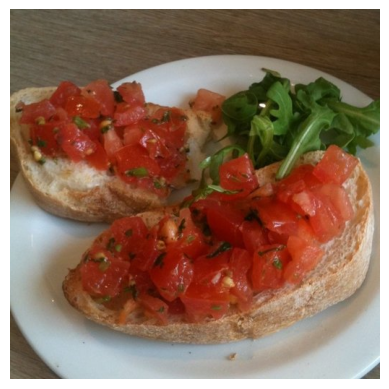

is this a food Y or N ?y
[[0.40909093618392944, 0.6818181872367859]]


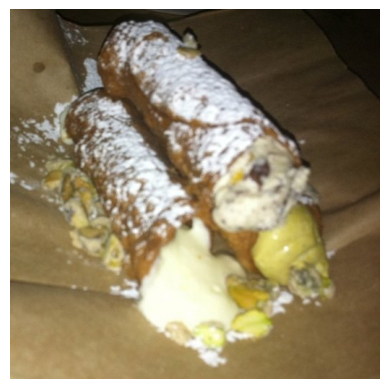

is this a food Y or N ?y
[[0.40909093618392944, 0.6818181872367859]]


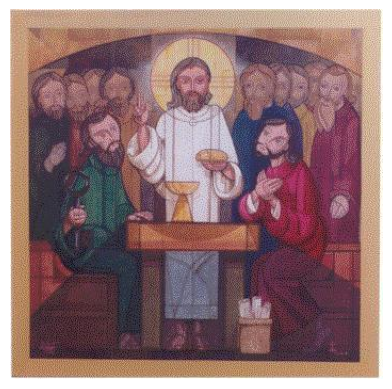

is this a food Y or N ?n
Training the model again...
[[0.40909093618392944, 0.6818181872367859]]


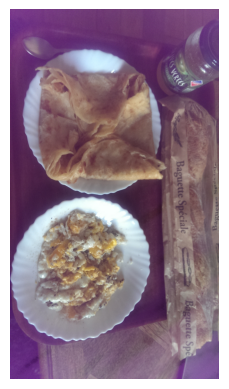

is this a food Y or N ?y
[[0.40909093618392944, 0.6818181872367859]]


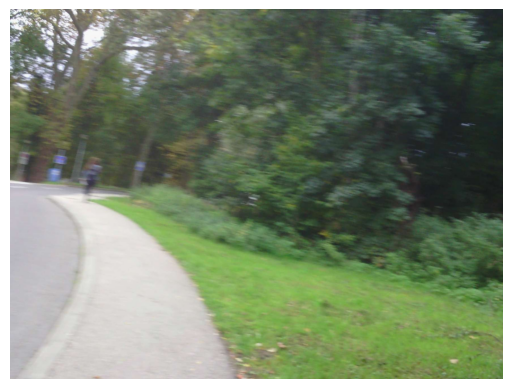

is this a food Y or N ?n
Training the model again...
[[0.40909093618392944, 0.6818181872367859]]


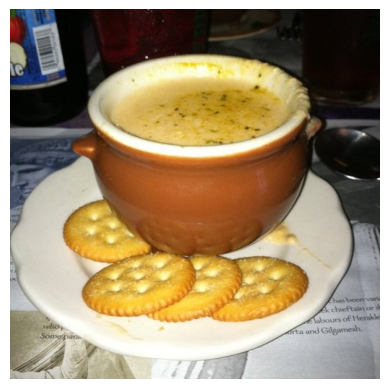

is this a food Y or N ?y
[[0.40909093618392944, 0.6818181872367859]]


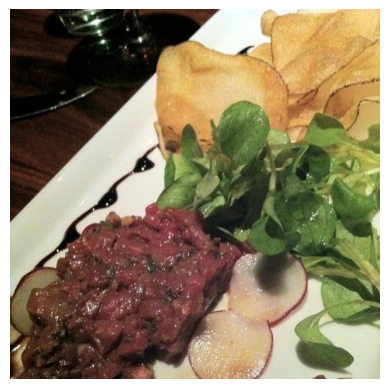

is this a food Y or N ?y
[[0.40909093618392944, 0.6818181872367859]]


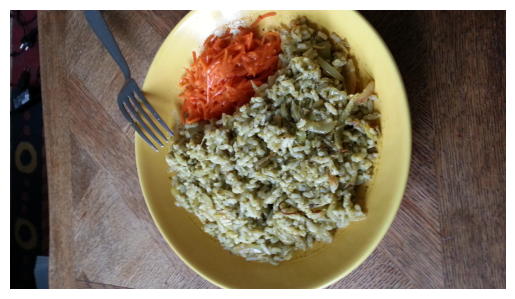

is this a food Y or N ?y
[[0.40909093618392944, 0.6818181872367859]]


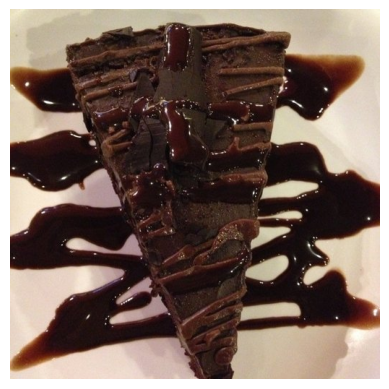

is this a food Y or N ?y
[[0.40909093618392944, 0.6818181872367859]]


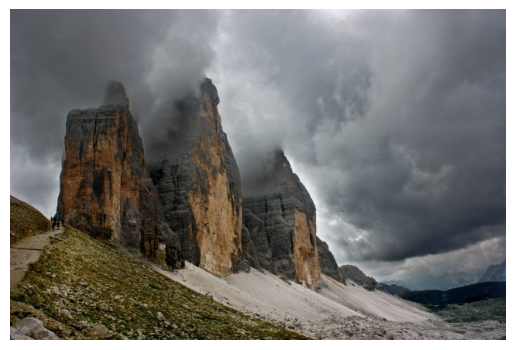

is this a food Y or N ?n
Training the model again...
[[0.40909093618392944, 0.6818181872367859]]
Found 32 images belonging to 2 classes.
Found 44 images belonging to 2 classes.
Found 568 images belonging to 2 classes.
choose model vgg or resnet50vgg
model compiled vgg
Training begin.....
Epoch 1/5


2023-01-26 17:10:18.137176: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


1/1 [==============================] - ETA: 0s - loss: 3.3047 - accuracy: 0.4375

2023-01-26 17:10:20.289886: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


1/1 [==============================] - 4s 4s/step - loss: 3.3047 - accuracy: 0.4375 - val_loss: 4.2606 - val_accuracy: 0.5682
Epoch 2/5
1/1 [==============================] - 3s 3s/step - loss: 2.2963 - accuracy: 0.4688 - val_loss: 0.7368 - val_accuracy: 0.7273
Epoch 2: early stopping


2023-01-26 17:10:25.075438: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


18/18 [==============================] - 17s 1s/step
Model Accuracy  : 60.04%


Do you want more accuracy ?y


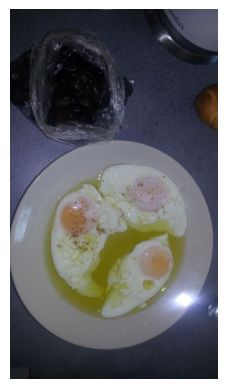

is this a food Y or N ?y
[[0.4375, 0.46875]]


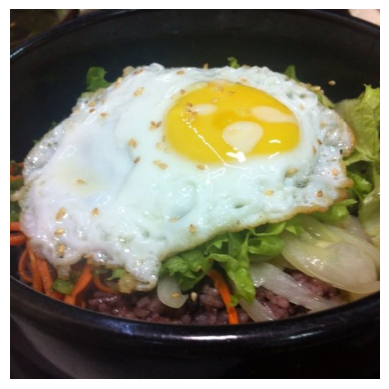

is this a food Y or N ?y
[[0.4375, 0.46875]]


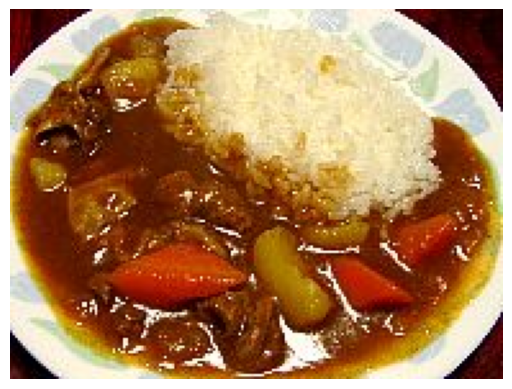

is this a food Y or N ?y
[[0.4375, 0.46875]]


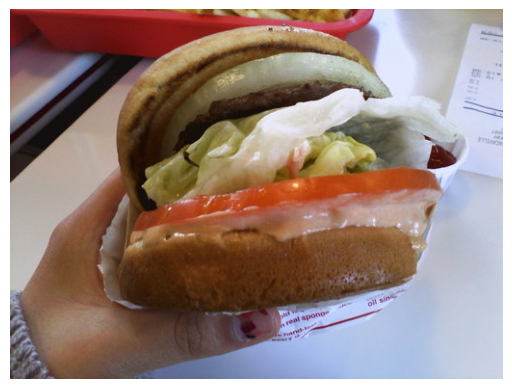

is this a food Y or N ?y
[[0.4375, 0.46875]]


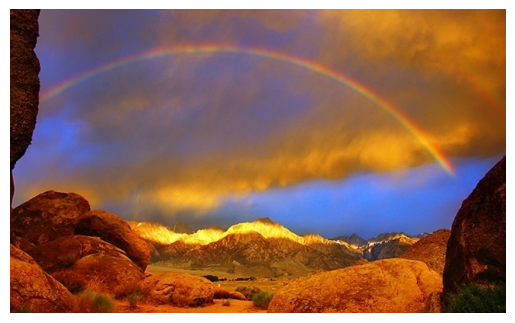

is this a food Y or N ?n
Training the model again...
[[0.4375, 0.46875]]


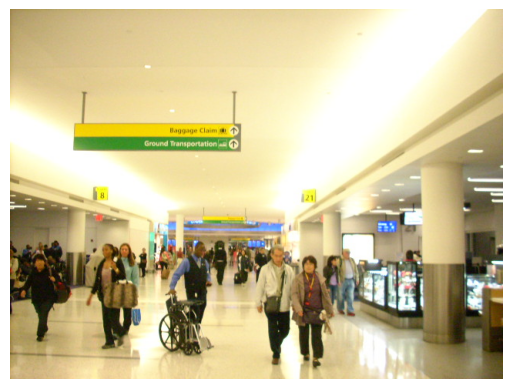

is this a food Y or N ?n
Training the model again...
[[0.4375, 0.46875]]


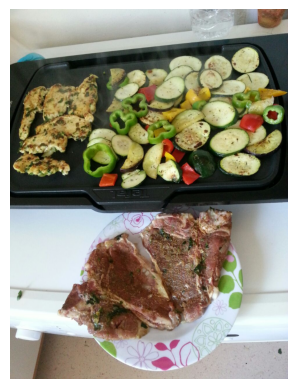

is this a food Y or N ?y
[[0.4375, 0.46875]]


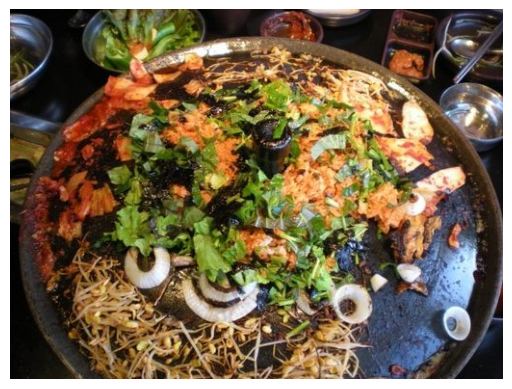

is this a food Y or N ?y
[[0.4375, 0.46875]]


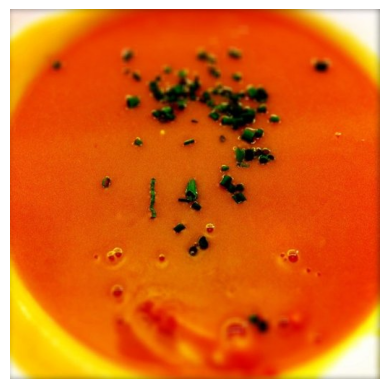

is this a food Y or N ?y
[[0.4375, 0.46875]]


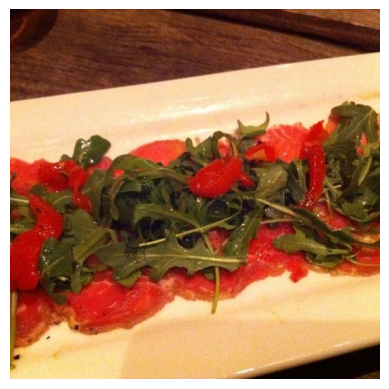

is this a food Y or N ?y
[[0.4375, 0.46875]]
Found 42 images belonging to 2 classes.
Found 44 images belonging to 2 classes.
Found 558 images belonging to 2 classes.
choose model vgg or resnet50vgg
model compiled vgg
Training begin.....
Epoch 1/5


2023-01-26 17:11:03.762129: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


2/2 [==============================] - ETA: 0s - loss: 1.5990 - accuracy: 0.5000

2023-01-26 17:11:06.204574: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


2/2 [==============================] - 4s 2s/step - loss: 1.5990 - accuracy: 0.5000 - val_loss: 1.4436 - val_accuracy: 0.5455
Epoch 2/5
2/2 [==============================] - 3s 3s/step - loss: 1.1769 - accuracy: 0.5714 - val_loss: 1.6152 - val_accuracy: 0.5909
Epoch 2: early stopping


2023-01-26 17:11:11.214601: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


18/18 [==============================] - 17s 990ms/step
Model Accuracy  : 68.46%


Do you want more accuracy ?n
model trained well ;-)


In [13]:
useri()

In [14]:
print(model_score)

[77.16262975778547, 60.03521126760564, 68.45878136200717]


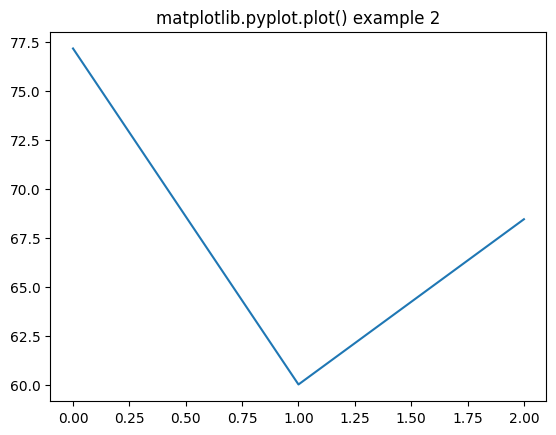

In [19]:
import matplotlib.pyplot as plt
import numpy as np
train_list=len(train_pic_path)
# xdata1 = len(train_pic_path)
xdata1 = model_score
plt.plot(xdata1, train_folder,color ='tab:blue')
plt.title('matplotlib.pyplot.plot() example 2')
	
# display the plot
plt.show()
